# Projet Smart City : Analyse des Arbres de Paris

## 1. Introduction et Objectif du Projet

### 1.1. Contexte du Projet
- **Présentation du contexte** : Ce projet s'inscrit dans le cadre des initiatives de Smart City visant à améliorer la gestion des espaces verts urbains à travers une utilisation optimisée des données. Les arbres jouent un rôle crucial dans la réduction des îlots de chaleur, l'amélioration de la qualité de l'air, et le bien-être des habitants. Analyser les données des arbres urbains permet une gestion plus intelligente et durable de ces ressources naturelles.
- **Description des données** : Le jeu de données utilisé dans ce projet contient des informations géographiques (localisation des arbres), taxonomiques (types et espèces d'arbres), ainsi que des mesures physiques (taille, circonférence). Il couvre les arbres de différents arrondissements de Paris.

### 1.2. Objectif du Projet
L'objectif de ce projet est de mener une analyse approfondie des arbres de la ville de Paris à partir du jeu de données fourni. Les objectifs spécifiques incluent :
- **Étudier la répartition géographique et la densité des arbres** dans les différents arrondissements de Paris, afin de mieux comprendre leur distribution à travers la ville et les espaces verts.
- **Analyser les espèces d'arbres les plus courantes** et la diversité arboricole à Paris, en identifiant les espèces les plus représentées et leur répartition géographique.
- **Explorer les caractéristiques physiques des arbres** (hauteur, circonférence) et identifier des tendances générales dans leur distribution, ainsi que les anomalies ou valeurs aberrantes dans ces variables.
- **Visualiser la localisation des arbres remarquables** et analyser leur répartition géographique, en mettant en évidence leur rareté et leur concentration dans certaines zones de la ville.
- **Améliorer la qualité des données par des techniques de nettoyage** : suppression des doublons, gestion des valeurs manquantes, et identification des valeurs aberrantes.
- **Proposer des recommandations pour la gestion des arbres urbains**, afin de contribuer à une gestion plus durable et efficace des espaces verts dans une Smart City.
---



## 2. Importation et Préparation des Données

Dans cette section, nous allons importer les bibliothèques nécessaires, charger le jeu de données des arbres de Paris, et effectuer une première exploration rapide pour comprendre sa structure.

### 2.1. Importation des Bibliothèques
Nous allons utiliser plusieurs bibliothèques Python pour cette analyse, notamment `pandas` pour la manipulation des données, `numpy` pour les calculs numériques, `matplotlib` et `seaborn` pour la visualisation des données.


In [1]:
# Importation des bibliothèques nécessaires
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import folium
from folium.plugins import MarkerCluster

# Configuration de l'affichage des graphiques
sns.set(style="whitegrid")

### 2.2. Chargement du Jeu de Données
Le fichier CSV contenant les informations des arbres de Paris est chargé dans un dataframe `data`. Nous allons également afficher les premières lignes du jeu de données pour en avoir un aperçu.

In [2]:
data = pd.read_csv('p2-arbres-fr.csv', sep=';')
data.head()

,id,type_emplacement,domanialite,arrondissement,complement_addresse,numero,lieu,id_emplacement,libelle_francais,genre,espece,variete,circonference_cm,hauteur_m,stade_developpement,remarquable,geo_point_2d_a,geo_point_2d_b
0,99874,Arbre,Jardin,PARIS 7E ARRDT,NaN,NaN,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E,19,Marronnier,Aesculus,hippocastanum,NaN,20,5,NaN,0.0,48.857620,2.320962
1,99875,Arbre,Jardin,PARIS 7E ARRDT,NaN,NaN,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E,20,If,Taxus,baccata,NaN,65,8,A,NaN,48.857656,2.321031
2,99876,Arbre,Jardin,PARIS 7E ARRDT,NaN,NaN,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E,21,If,Taxus,baccata,NaN,90,10,A,NaN,48.857705,2.321061
3,99877,Arbre,Jardin,PARIS 7E ARRDT,NaN,NaN,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E,22,Erable,Acer,negundo,NaN,60,8,A,NaN,48.857722,2.321006
4,99878,Arbre,Jardin,PARIS 17E ARRDT,NaN,NaN,PARC CLICHY-BATIGNOLLES-MARTIN LUTHER KING,000G0037,Arbre à miel,Tetradium,daniellii,NaN,38,0,NaN,NaN,48.890435,2.315289


### 2.3. Exploration Initiale des Données
Nous allons maintenant examiner la structure du jeu de données, notamment le nombre de lignes et de colonnes, ainsi que les types de variables présentes.

In [3]:
print(f"Le jeu de données contient {data.shape[0]} lignes et {data.shape[1]} colonnes.\n")
data.info()


Le jeu de données contient 200137 lignes et 18 colonnes.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200137 entries, 0 to 200136
Data columns (total 18 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   id                   200137 non-null  int64  
 1   type_emplacement     200137 non-null  object 
 2   domanialite          200136 non-null  object 
 3   arrondissement       200137 non-null  object 
 4   complement_addresse  30902 non-null   object 
 5   numero               0 non-null       float64
 6   lieu                 200137 non-null  object 
 7   id_emplacement       200137 non-null  object 
 8   libelle_francais     198640 non-null  object 
 9   genre                200121 non-null  object 
 10  espece               198385 non-null  object 
 11  variete              36777 non-null   object 
 12  circonference_cm     200137 non-null  int64  
 13  hauteur_m            200137 non-null  int64  
 14  stade_deve

In [4]:
print("\nValeurs manquantes par colonne :")
print(data.isnull().sum())


Valeurs manquantes par colonne :
id                          0
type_emplacement            0
domanialite                 1
arrondissement              0
complement_addresse    169235
numero                 200137
lieu                        0
id_emplacement              0
libelle_francais         1497
genre                      16
espece                   1752
variete                163360
circonference_cm            0
hauteur_m                   0
stade_developpement     67205
remarquable             63098
geo_point_2d_a              0
geo_point_2d_b              0
dtype: int64


### 2.4. Description des Colonnes du Jeu de Données
Nous allons maintenant examiner plus en détail les variables présentes dans le jeu de données, en les séparant en deux catégories : les variables numériques et les variables non-numériques.

#### Variables Numériques
Les variables numériques incluent les informations quantifiables telles que la circonférence et la hauteur des arbres. 

#### Variables Non-Numériques
Les variables non-numériques incluent des informations catégorielles comme le type d'emplacement, la variété d'arbre, et l'arrondissement. Ces informations vont nous aider à mieux comprendre la répartition des arbres dans la ville.


#### 2.4.1. Variables Numériques

In [5]:
# Séparation des variables numériques et non-numériques
variables_numeriques = data.select_dtypes(include=[np.number]).columns.tolist()
variables_non_numeriques = data.select_dtypes(exclude=[np.number]).columns.tolist()

# Description des variables numériques
print("Variables numériques :")
print(variables_numeriques)
print("\nStatistiques descriptives des variables numériques :")
display(data[variables_numeriques].describe())


Variables numériques :
['id', 'numero', 'circonference_cm', 'hauteur_m', 'remarquable', 'geo_point_2d_a', 'geo_point_2d_b']

Statistiques descriptives des variables numériques :


,id,numero,circonference_cm,hauteur_m,remarquable,geo_point_2d_a,geo_point_2d_b
count,2.001370e+05,0.0,200137.000000,200137.000000,137039.000000,200137.000000,200137.000000
mean,3.872027e+05,NaN,83.380479,13.110509,0.001343,48.854491,2.348208
std,5.456032e+05,NaN,673.190213,1971.217387,0.036618,0.030234,0.051220
min,9.987400e+04,NaN,0.000000,0.000000,0.000000,48.742290,2.210241
25%,1.559270e+05,NaN,30.000000,5.000000,0.000000,48.835021,2.307530
50%,2.210780e+05,NaN,70.000000,8.000000,0.000000,48.854162,2.351095
75%,2.741020e+05,NaN,115.000000,12.000000,0.000000,48.876447,2.386838
max,2.024745e+06,NaN,250255.000000,881818.000000,1.000000,48.911485,2.469759


In [6]:
id_nb_val = data['id'].unique().shape[0]
id_min = data['id'].min()
id_max = data['id'].max()
print(f"La variable id a {id_nb_val} valeurs uniques comprises entre {id_min} et {id_max}")

La variable id a 200137 valeurs uniques comprises entre 99874 et 2024745


In [7]:
data['remarquable'].unique()

array([ 0., nan,  1.])

Les données contiennent 7 variables numériques : `id`, `numero`, `circonference_cm`, `hauteur_m`, `remarquable`, `geo_point_2d_a`, et `geo_point_2d_b`. Voici une description détaillée de ces variables :

- **id** : 
  - Il s'agit de l'identifiant unique de chaque arbre. 
  - C'est une variable numérique continue composée d'entiers. 
  - Chaque valeur est unique pour chaque arbre. 
  - Les valeurs sont comprises entre 99 874 et 2 024 745, ce qui couvre une grande plage de valeurs. 
  - **Note** : Il n'y a pas de valeur manquante pour cette variable.
  
- **numero** : 
  - Supposément le numéro de rue associé à l'adresse des arbres, mais cette colonne ne contient aucune valeur non-nulle. 
  - Il est donc nécessaire de la supprimer ou de l'ignorer lors des analyses.

- **circonference_cm** : 
  - Cette variable représente la circonférence du tronc de chaque arbre en centimètres. 
  - C'est une variable numérique continue composée d'entiers. 
  - Les valeurs sont comprises entre 0 et 250 255 cm, bien que certaines valeurs aberrantes (0 cm ou des valeurs très élevées) doivent être traitées (remplacer les 0 par des valeurs manquantes).
  - Nous examinerons plus tard les distributions et les valeurs aberrantes pour cette variable.

- **hauteur_m** : 
  - Il s'agit de la hauteur de chaque arbre en mètres.
  - Comme la circonférence, c'est une variable continue composée d'entiers. 
  - Les valeurs sont comprises entre 0 et 881 818 m, bien qu'il soit peu probable qu'un arbre atteigne une telle hauteur. Des valeurs aberrantes sont donc à considérer, et les valeurs de 0 doivent être remplacées par des valeurs manquantes (NaN).

- **remarquable** : 
  - Cette variable discrète indique si un arbre est remarquable ou non, avec deux valeurs possibles : 
    - 0 : L'arbre n'est pas remarquable.
    - 1 : L'arbre est remarquable.
  - Elle contient quelques valeurs manquantes. Nous devons vérifier la distribution des arbres remarquables pour mieux comprendre leur répartition.

- **geo_point_2d_a** et **geo_point_2d_b** : 
  - Ces deux variables correspondent aux coordonnées GPS des arbres. 
  - **geo_point_2d_a** représente la latitude et **geo_point_2d_b** la longitude. 
  - Paris étant aux coordonnées approximatives (48.87, 2.33), ces valeurs sont cohérentes avec la géolocalisation dans la ville.
  - Ces variables sont numériques continues composées de réels. La moyenne de **geo_point_2d_a** est d'environ 48.85, et celle de **geo_point_2d_b** est d'environ 2.35, ce qui est attendu pour la localisation de Paris.



#### Suppression de la colonne numero

In [8]:
# Suppression de la colonne 'numero'
data_clean = data.drop(columns=['numero'])

print(data_clean.columns)

Index(['id', 'type_emplacement', 'domanialite', 'arrondissement',
       'complement_addresse', 'lieu', 'id_emplacement', 'libelle_francais',
       'genre', 'espece', 'variete', 'circonference_cm', 'hauteur_m',
       'stade_developpement', 'remarquable', 'geo_point_2d_a',
       'geo_point_2d_b'],
      dtype='object')


La colonne `numero`, qui contient uniquement des valeurs manquantes, a été supprimée. Nous poursuivons l'analyse sans cette variable.


#### Remplacement des Valeurs à 0 par NaN

Nous avons identifié que certaines valeurs dans les colonnes `circonference_cm` et `hauteur_m` sont égales à 0, ce qui est irréaliste dans le contexte de cette analyse. Ces valeurs seront remplacées par des `NaN` afin de ne pas biaiser les analyses statistiques et les visualisations à venir.

In [9]:
# Remplacement des 0 par des NaN dans les colonnes 'circonference_cm' et 'hauteur_m'
data_clean.loc[data_clean['circonference_cm'] == 0, 'circonference_cm'] = np.nan
data_clean.loc[data_clean['hauteur_m'] == 0, 'hauteur_m'] = np.nan

print("Nombre de valeurs manquantes après remplacement des 0 par NaN :")
print(data_clean[['circonference_cm', 'hauteur_m']].isnull().sum())

Nombre de valeurs manquantes après remplacement des 0 par NaN :
circonference_cm    25867
hauteur_m           39219
dtype: int64


#### 2.4.2. Variables Non-Numériques

In [10]:
# Description des variables non-numériques
print("\nVariables non-numériques :")
print(variables_non_numeriques)
print("\nAperçu des premières valeurs des variables non-numériques :")
display(data_clean[variables_non_numeriques].head())


Variables non-numériques :
['type_emplacement', 'domanialite', 'arrondissement', 'complement_addresse', 'lieu', 'id_emplacement', 'libelle_francais', 'genre', 'espece', 'variete', 'stade_developpement']

Aperçu des premières valeurs des variables non-numériques :


,type_emplacement,domanialite,arrondissement,complement_addresse,lieu,id_emplacement,libelle_francais,genre,espece,variete,stade_developpement
0,Arbre,Jardin,PARIS 7E ARRDT,NaN,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E,19,Marronnier,Aesculus,hippocastanum,NaN,NaN
1,Arbre,Jardin,PARIS 7E ARRDT,NaN,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E,20,If,Taxus,baccata,NaN,A
2,Arbre,Jardin,PARIS 7E ARRDT,NaN,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E,21,If,Taxus,baccata,NaN,A
3,Arbre,Jardin,PARIS 7E ARRDT,NaN,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E,22,Erable,Acer,negundo,NaN,A
4,Arbre,Jardin,PARIS 17E ARRDT,NaN,PARC CLICHY-BATIGNOLLES-MARTIN LUTHER KING,000G0037,Arbre à miel,Tetradium,daniellii,NaN,NaN


In [11]:
# Affichage des valeurs uniques pour chaque variable non-numérique
for col in variables_non_numeriques:
    print(f"\nValeurs uniques pour {col}:")
    print(data_clean[col].unique())



Valeurs uniques pour type_emplacement:
['Arbre']

Valeurs uniques pour domanialite:
['Jardin' 'Alignement' 'DJS' 'DFPE' 'CIMETIERE' 'DASCO' 'DAC'
 'PERIPHERIQUE' 'DASES' nan]

Valeurs uniques pour arrondissement:
['PARIS 7E ARRDT' 'PARIS 17E ARRDT' 'PARIS 16E ARRDT' 'PARIS 4E ARRDT'
 'PARIS 13E ARRDT' 'PARIS 12E ARRDT' 'PARIS 19E ARRDT' 'PARIS 14E ARRDT'
 'PARIS 15E ARRDT' 'PARIS 3E ARRDT' 'PARIS 20E ARRDT' 'PARIS 18E ARRDT'
 'PARIS 6E ARRDT' 'PARIS 11E ARRDT' 'PARIS 1ER ARRDT' 'PARIS 2E ARRDT'
 'PARIS 5E ARRDT' 'VAL-DE-MARNE' 'SEINE-SAINT-DENIS' 'HAUTS-DE-SEINE'
 'PARIS 9E ARRDT' 'PARIS 10E ARRDT' 'PARIS 8E ARRDT' 'BOIS DE BOULOGNE'
 'BOIS DE VINCENNES']

Valeurs uniques pour complement_addresse:
[nan 'c 12' '12-36' ... 'au n.14' 'F2bis' '40face']

Valeurs uniques pour lieu:
['MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E'
 'PARC CLICHY-BATIGNOLLES-MARTIN LUTHER KING'
 'SQUARE ALEXANDRE ET RENE PARODI / 1 PLACE DE LA PORTE MAILLOT' ...
 'TERRAIN D EDUCATION PHYSIQUE / 49 RUE OLIVIER METR

In [12]:
# Compte des valeurs uniques par colonne
valeurs_uniques = data_clean.nunique()

print("Nombre de valeurs uniques par variable :")
print(valeurs_uniques)


Nombre de valeurs uniques par variable :
id                     200137
type_emplacement            1
domanialite                 9
arrondissement             25
complement_addresse      3795
lieu                     6921
id_emplacement          69040
libelle_francais          192
genre                     175
espece                    539
variete                   436
circonference_cm          530
hauteur_m                 142
stade_developpement         4
remarquable                 2
geo_point_2d_a         200107
geo_point_2d_b         200114
dtype: int64


Les données contiennent plusieurs variables non-numériques, dont certaines apportent peu d'intérêt à l'étude en raison de la nature de leurs valeurs. Voici une description détaillée de ces variables :

- **type_emplacement** : 
  - Cette variable catégorielle décrit le type d'emplacement des arbres. Cependant, elle ne contient qu'une seule valeur, "Arbre", pour l'ensemble du jeu de données, ce qui la rend peu informative pour l'analyse.
  - **Conclusion** : Cette variable n'apporte pas d'information pertinente pour notre étude et peut être ignorée.

- **domanialite** : 
  - Cette variable catégorielle renseigne sur la gestion de l'espace où se trouve l'arbre (ex : "Jardin", "Alignement", "Cimetière", etc.).
  - Elle permet de comprendre sous quelle gestion chaque arbre est placé, ce qui peut être pertinent pour des analyses sur la répartition des arbres en fonction de leur gestion.

- **arrondissement** : 
  - Cette variable catégorielle indique dans quel arrondissement de Paris l'arbre est situé (ex : "PARIS 7E ARRDT", "PARIS 17E ARRDT").
  - Il y a 25 arrondissements ou zones différentes, ce qui en fait une variable clé pour la répartition géographique des arbres.

- **complement_addresse** : 
  - Cette colonne est censée fournir des informations complémentaires sur l’adresse de l'arbre, mais elle contient une majorité de valeurs manquantes.

- **lieu** : 
  - Cette variable catégorielle donne un nom ou une description du lieu précis où l'arbre est situé, comme une rue ou un parc (ex : "PARC CLICHY-BATIGNOLLES-MARTIN LUTHER KING").
  - C'est une variable pertinente pour étudier la localisation spécifique des arbres dans Paris et peut être utilisée dans des analyses plus détaillées.

- **libelle_francais** : 
  - Cette variable catégorielle contient le nom commun des arbres en français (ex : "Marronnier", "If", "Erable").
  - Elle est utile pour analyser la répartition des espèces d'arbres dans la ville.

- **genre** : 
  - Cette variable catégorielle représente le genre botanique de l'arbre (ex : "Aesculus", "Acer", "Platanus").
  - Cette variable est utile pour classifier les arbres selon leur famille botanique.

- **espece** : 
  - Cette variable catégorielle correspond à l'espèce de l'arbre (ex : "hippocastanum" pour **Aesculus**, "negundo" pour **Acer**).
  - Il y a 539 espèces uniques dans les données, ce qui en fait une variable clé pour l'analyse des espèces.

- **variete** : 
  - Cette colonne contient des informations sur la variété spécifique d'une espèce d'arbre. Toutefois, elle comporte une grande quantité de valeurs manquantes.

- **stade_developpement** : 
  - Cette variable catégorielle décrit le stade de développement de l'arbre (par exemple, "J" pour Jeune, "A" pour Adulte, "M" pour Mature, "JA" pour Jeune Adulte).
  - Cette variable est pertinente pour analyser l'état de développement des arbres à Paris.

La variable non-numérique `type_emplacement` n'est pas utile pour l'étude en raison de son manque de variabilité. En revanche, d'autres variables, comme `domanialite`, `arrondissement`, `libelle_francais`, `genre`, et `espece`, sont importantes pour l'analyse de la répartition et des caractéristiques des arbres.

#### Suppression de la colonne type_emplacement

In [13]:
# Suppression de la colonne 'type_emplacement'
data_clean.drop(columns=['type_emplacement'], inplace=True)

print(data_clean.columns)

Index(['id', 'domanialite', 'arrondissement', 'complement_addresse', 'lieu',
       'id_emplacement', 'libelle_francais', 'genre', 'espece', 'variete',
       'circonference_cm', 'hauteur_m', 'stade_developpement', 'remarquable',
       'geo_point_2d_a', 'geo_point_2d_b'],
      dtype='object')


La colonne `type_emplacement`, qui n'apporte pas d'information pertinente, a été supprimée. Nous continuons l'analyse sans cette variable.

---

## 3. Exploration Initiale des Données
### 3.1. Statistiques Descriptives des Variables Numériques
Dans cette section, nous allons examiner les statistiques descriptives des variables numériques, comme la hauteur, la circonférence et les coordonnées GPS. Cela nous permettra d'identifier les ordres de grandeur, les valeurs aberrantes potentielles et les distributions générales de ces variables.


In [14]:
# Séparation des variables numériques et calcul des statistiques descriptives
variables_numeriques = ['id', 'circonference_cm', 'hauteur_m', 'remarquable', 'geo_point_2d_a', 'geo_point_2d_b']

# Statistiques descriptives des variables numériques
print("Statistiques descriptives des variables numériques :")
display(data_clean[variables_numeriques].describe())


Statistiques descriptives des variables numériques :


,id,circonference_cm,hauteur_m,remarquable,geo_point_2d_a,geo_point_2d_b
count,2.001370e+05,174270.000000,160918.000000,137039.000000,200137.000000,200137.000000
mean,3.872027e+05,95.756694,16.305808,0.001343,48.854491,2.348208
std,5.456032e+05,720.601739,2198.334745,0.036618,0.030234,0.051220
min,9.987400e+04,1.000000,1.000000,0.000000,48.742290,2.210241
25%,1.559270e+05,45.000000,6.000000,0.000000,48.835021,2.307530
50%,2.210780e+05,80.000000,10.000000,0.000000,48.854162,2.351095
75%,2.741020e+05,123.000000,14.000000,0.000000,48.876447,2.386838
max,2.024745e+06,250255.000000,881818.000000,1.000000,48.911485,2.469759


### 3.2. Distribution des Variables Numériques
#### 3.2.1. Circonférence et Hauteur des Arbres
Nous allons visualiser la répartition des principales variables numériques, telles que la hauteur et la circonférence des arbres, à l'aide de boîtes à moustaches. Cela nous permettra de mieux comprendre la dispersion des données, d'identifier les valeurs centrales (comme la médiane) et de mettre en évidence les éventuelles valeurs aberrantes.

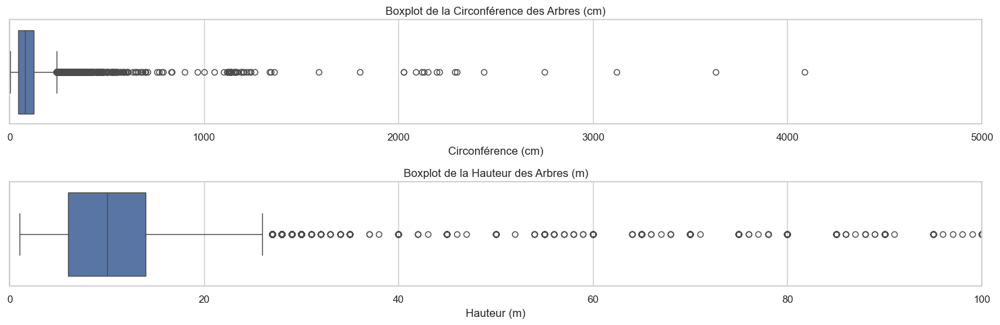

In [15]:
plt.figure(figsize=(15, 5))

# Boxplot pour la circonférence
plt.subplot(2, 1, 1)
sns.boxplot(x=data_clean['circonference_cm'])
plt.title('Boxplot de la Circonférence des Arbres (cm)')
plt.xlabel('Circonférence (cm)')
plt.xlim(0, 5000)  # Limiter l'axe à 5000 cm pour mieux voir la distribution principale

# Boxplot pour la hauteur
plt.subplot(2, 1, 2)
sns.boxplot(x=data_clean['hauteur_m'])
plt.title('Boxplot de la Hauteur des Arbres (m)')
plt.xlabel('Hauteur (m)')
plt.xlim(0, 100)  # Limiter l'axe à 100 m pour mieux voir la distribution principale

plt.tight_layout()
plt.show()


Les boîtes à moustaches (boxplots) pour la circonférence et la hauteur des arbres révèlent plusieurs éléments intéressants concernant la répartition des données :

1. **Circonférence des arbres** :
   - La majorité des arbres ont une circonférence située sous les 500 cm, ce qui est conforme à ce que l'on pourrait attendre pour des arbres urbains. 
   - Les moustaches indiquent que la majorité des valeurs se situent dans une plage relativement restreinte, mais nous observons plusieurs **valeurs aberrantes** très élevées.
   - Ces valeurs aberrantes devront être examinées plus en détail pour décider d'un éventuel traitement (ex : suppression ou correction).

2. **Hauteur des arbres** :
   - De la même manière, la hauteur des arbres est globalement concentrée sous 50 mètres, avec la majorité des valeurs entre 10 et 30 mètres.
   - Cependant, des valeurs extrêmement élevées sont présentes dans le jeu de données, avec des arbres ayant des hauteurs signalées supérieures à 200 000 mètres. Ces valeurs sont clairement des **anomalies** qu'il faudra traiter lors du nettoyage des données.

En résumé, les boxplots montrent une répartition raisonnable pour la majorité des arbres, mais révèlent également la présence de **valeurs aberrantes** (extrêmement grandes) dans les deux variables, ce qui nécessitera un traitement pour ne pas fausser les analyses futures.

#### 3.2.2. Répartition de la Variable remarquable
La variable `remarquable` indique si un arbre est considéré comme remarquable (1) ou non (0). Nous allons également prendre en compte les valeurs nulles dans cette analyse pour quantifier leur importance.

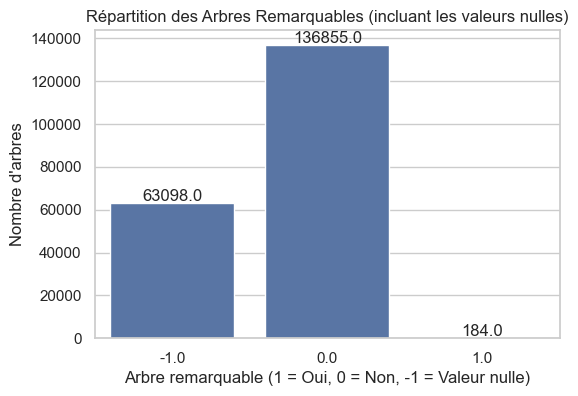

In [16]:
plt.figure(figsize=(6, 4))

data_clean['remarquable_temp'] = data_clean['remarquable'].fillna(-1)

ax = sns.countplot(x='remarquable_temp', data=data_clean)
plt.title('Répartition des Arbres Remarquables (incluant les valeurs nulles)')
plt.xlabel('Arbre remarquable (1 = Oui, 0 = Non, -1 = Valeur nulle)')
plt.ylabel('Nombre d\'arbres')

for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')

plt.show()

data_clean.drop(columns=['remarquable_temp'], inplace=True)


Voici les principales observations :
- La majorité des arbres (**136 855**) ne sont **pas considérés comme remarquables** (valeur 0).
- Seuls **184 arbres** sont classifiés comme **remarquables** (valeur 1), ce qui représente une proportion très faible du dataset total.
- On observe également **63 098 valeurs nulles** pour cette variable, ce qui représente une part significative des données. Cela pourrait nécessiter une attention particulière lors du traitement des données manquantes pour éviter un biais potentiel dans l'analyse.

En résumé, le dataset est largement dominé par des arbres non remarquables, avec très peu d'arbres considérés comme remarquables. De plus, un nombre important de valeurs nulles doit être pris en compte dans les étapes de traitement des données, car elles pourraient avoir un impact significatif sur les analyses futures si elles ne sont pas correctement traitées (par exemple, par imputation ou suppression).

### 3.3. Exploration des Variables Non-Numériques
Nous allons ensuite explorer les principales variables non-numériques du dataset, telles que arrondissement, genre et espèce, pour comprendre la répartition géographique et la diversité botanique des arbres à Paris.

In [17]:
columns_to_see=["domanialite","arrondissement","lieu","id_emplacement","libelle_francais","genre","espece","variete","stade_developpement"]
data_clean[[col for col in columns_to_see]].describe(include='all')

,domanialite,arrondissement,lieu,id_emplacement,libelle_francais,genre,espece,variete,stade_developpement
count,200136,200137,200137,200137,198640,200121,198385,36777,132932
unique,9,25,6921,69040,192,175,539,436,4
top,Alignement,PARIS 15E ARRDT,PARC FLORAL DE PARIS / ROUTE DE LA PYRAMIDE,101001,Platane,Platanus,x hispanica,Baumannii',A
freq,104949,17151,2995,1324,42508,42591,36409,4538,64438


#### 3.3.1. Répartition des Arbres par Arrondissement
La variable `arrondissement` nous permet d'analyser la répartition géographique des arbres à travers Paris. Nous allons visualiser la distribution des arbres dans les 25 arrondissements couverts par le dataset.


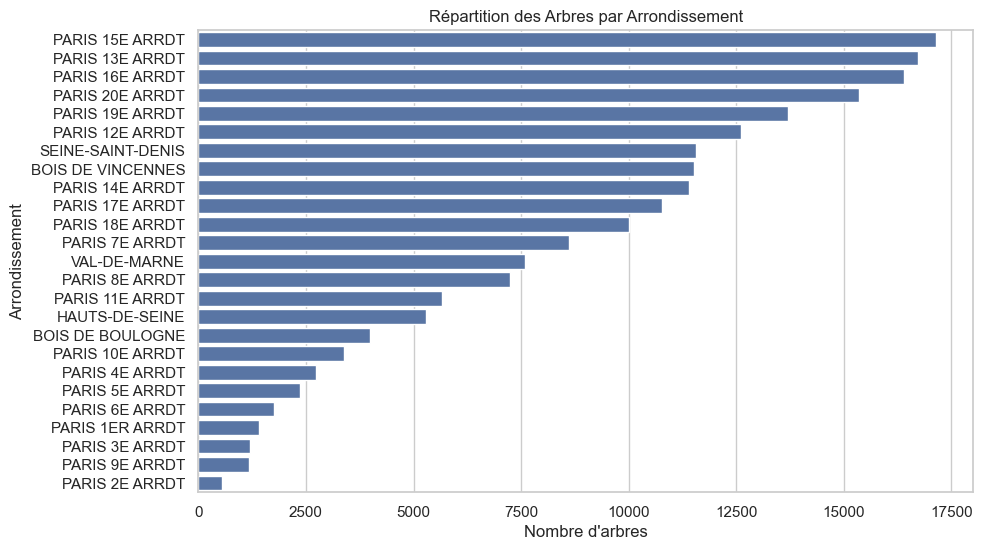

In [18]:
plt.figure(figsize=(10, 6))
sns.countplot(y='arrondissement', data=data_clean, order=data_clean['arrondissement'].value_counts().index)
plt.title('Répartition des Arbres par Arrondissement')
plt.xlabel('Nombre d\'arbres')
plt.ylabel('Arrondissement')
plt.show()


#### Commentaire sur la répartition des arbres par arrondissement

Le graphique montre la répartition des arbres dans les différents arrondissements et certaines zones périphériques de Paris. Les principales observations sont :
- Le **15e arrondissement** abrite le plus grand nombre d'arbres, avec plus de 17 000 arbres, suivi de près par les 13e, 16e, et 20e arrondissements.
- Des zones comme le **Bois de Vincennes** et le **Bois de Boulogne** se distinguent également par une forte concentration d'arbres, en dehors des arrondissements centraux.
- Les arrondissements les moins boisés incluent le **2e** et le **9e**, avec moins de 2 500 arbres chacun.

Cette répartition montre une forte densité arboricole dans les arrondissements périphériques et certaines zones vertes emblématiques de la ville.

---


#### 3.3.2. Répartition des Genres d'Arbres

Nous allons explorer la variable `genre`, qui représente le genre botanique des arbres. Nous allons visualiser les 10 genres d'arbres les plus courants dans Paris.


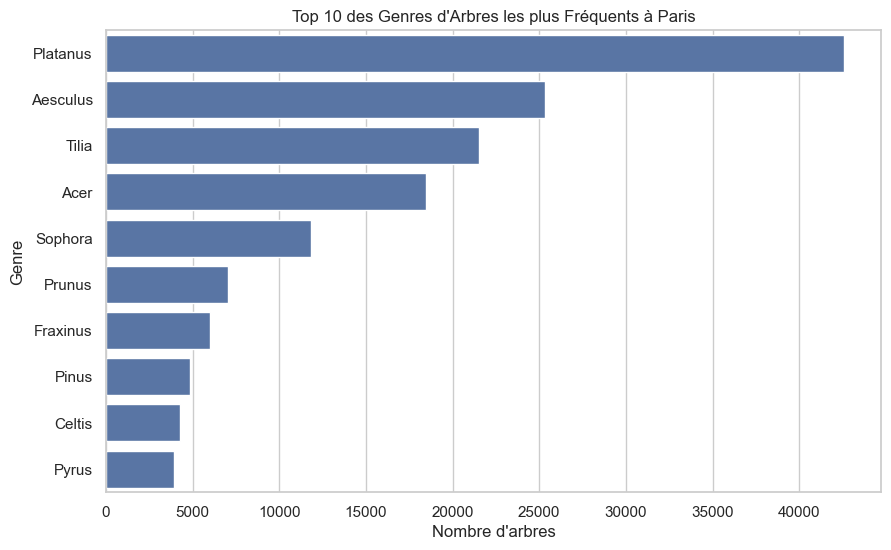

In [19]:
top_10_genres = data_clean['genre'].value_counts().nlargest(10).index
plt.figure(figsize=(10, 6))
sns.countplot(y='genre', data=data_clean[data_clean['genre'].isin(top_10_genres)], order=top_10_genres)
plt.title('Top 10 des Genres d\'Arbres les plus Fréquents à Paris')
plt.xlabel('Nombre d\'arbres')
plt.ylabel('Genre')
plt.show()

#### Commentaire sur la répartition des genres d'arbres

Le graphique ci-dessus présente le **Top 10 des genres d'arbres** les plus fréquents à Paris. Voici les principales observations :
- **Platanus** (platanes) est de loin le genre d'arbres le plus représenté avec plus de 40 000 individus, ce qui montre une forte présence de platanes dans les espaces verts parisiens.
- Les genres **Aesculus** (marronniers) et **Tilia** (tilleuls) occupent respectivement la deuxième et la troisième place avec plus de 25 000 arbres chacun, soulignant leur importance dans l'aménagement urbain de la capitale.
- Les autres genres tels que **Acer** (érables), **Sophora**, et **Prunus** sont également bien représentés, avec une diversité notable dans le choix des espèces plantées dans la ville.

En résumé, les arbres du genre **Platanus** dominent largement le paysage arboricole parisien, suivis par des espèces communes comme les marronniers et les tilleuls. Cette distribution témoigne d'une planification réfléchie des espèces adaptées au milieu urbain, avec des genres d'arbres connus pour leur robustesse et leur capacité à s'adapter à l'environnement urbain.

### 3.4. Analyse des Valeurs Manquantes

Enfin, nous allons examiner les valeurs manquantes dans le jeu de données après le remplacement des 0 par des `NaN` dans certaines variables numériques. Cette analyse nous permettra d'évaluer l'impact des valeurs manquantes et de décider des actions de nettoyage nécessaires.

#### 3.4.1. Vue d'Ensemble des Valeurs Manquantes

Valeurs manquantes par colonne :
domanialite                 1
complement_addresse    169235
libelle_francais         1497
genre                      16
espece                   1752
variete                163360
circonference_cm        25867
hauteur_m               39219
stade_developpement     67205
remarquable             63098
dtype: int64


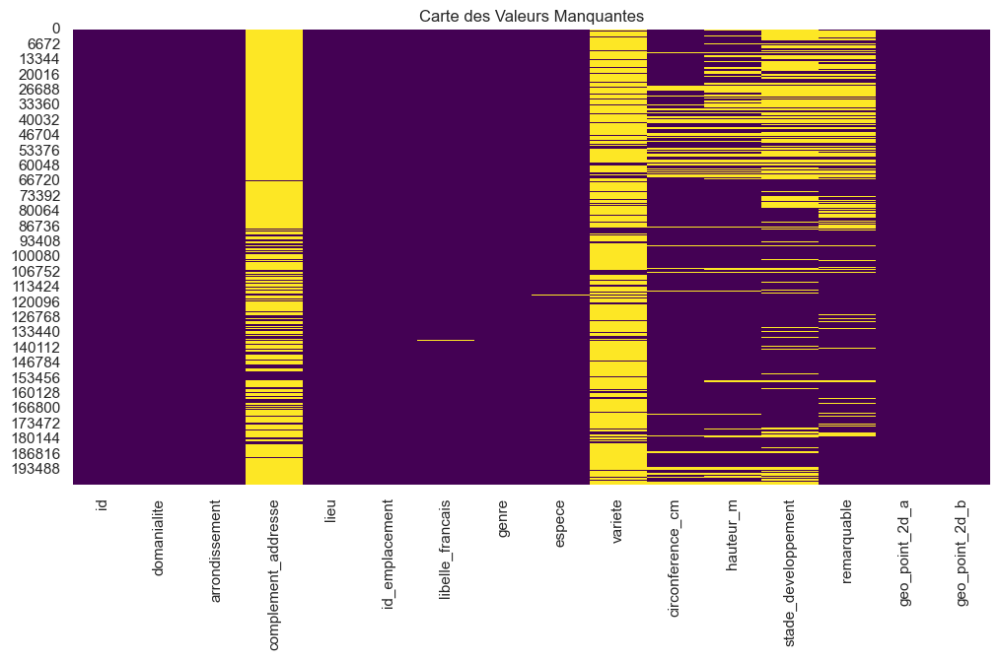

In [20]:
# Analyse des valeurs manquantes
valeurs_manquantes = data_clean.isnull().sum()
print("Valeurs manquantes par colonne :")
print(valeurs_manquantes[valeurs_manquantes > 0])

# Visualisation des valeurs manquantes avec une heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(data_clean.isnull(), cbar=False, cmap='viridis')
plt.title('Carte des Valeurs Manquantes')
plt.show()


Les colonnes `complement_addresse` et `variete` contiennent une proportion très importante de valeurs manquantes, ce qui les rend peu intéressantes pour l'analyse. La quantité de données manquantes est trop élevée pour qu'elles apportent une information fiable ou pertinente. Il est donc recommandé de les supprimer dans le cadre du nettoyage des données.


#### Suppression de la colonne type_emplacement

In [21]:
# Suppression des colonnes 'complement_addresse' et 'variete'
data_clean.drop(columns=['complement_addresse', 'variete'], inplace=True)

print(data_clean.columns)

Index(['id', 'domanialite', 'arrondissement', 'lieu', 'id_emplacement',
       'libelle_francais', 'genre', 'espece', 'circonference_cm', 'hauteur_m',
       'stade_developpement', 'remarquable', 'geo_point_2d_a',
       'geo_point_2d_b'],
      dtype='object')


Les colonnes `complement_addresse` et `variete`, ayant une trop grande quantité de valeurs manquantes, ont été supprimées. Nous continuons l'analyse sans ces variables.

#### 3.4.2. Analyse des Lignes avec de Nombreuses Valeurs Manquantes

In [22]:
# Calcul du nombre de valeurs manquantes par ligne
valeurs_manquantes_lignes = data_clean.isnull().sum(axis=1)

# Affichage des lignes qui ont plus de 5 valeurs manquantes
seuil = 5
lignes_a_supprimer = data_clean[valeurs_manquantes_lignes > seuil]

print(f"Nombre de lignes avec plus de {int(seuil)} valeurs manquantes : {len(lignes_a_supprimer)}")

lignes_a_supprimer.head()

Nombre de lignes avec plus de 5 valeurs manquantes : 16


,id,domanialite,arrondissement,lieu,id_emplacement,libelle_francais,genre,espece,circonference_cm,hauteur_m,stade_developpement,remarquable,geo_point_2d_a,geo_point_2d_b
195404,2018848,Jardin,PARIS 13E ARRDT,PC13 - JARDIN DE LA RUE DE LA POTERNE DES PEUP...,102027,NaN,NaN,NaN,NaN,NaN,NaN,0.0,48.821289,2.354485
195409,2018853,Jardin,PARIS 13E ARRDT,PC13 - JARDIN DE LA RUE DE LA POTERNE DES PEUP...,104005,NaN,NaN,NaN,NaN,NaN,NaN,0.0,48.821259,2.354242
195410,2018854,Jardin,PARIS 13E ARRDT,PC13 - JARDIN DE LA RUE DE LA POTERNE DES PEUP...,104006,NaN,NaN,NaN,NaN,NaN,NaN,0.0,48.821229,2.354212
195475,2018919,Jardin,PARIS 13E ARRDT,PC13 - JARDIN DE LA RUE DE LA POTERNE DES PEUP...,104030,NaN,NaN,NaN,NaN,NaN,NaN,0.0,48.821281,2.353322
195476,2018920,Jardin,PARIS 13E ARRDT,PC13 - JARDIN DE LA RUE DE LA POTERNE DES PEUP...,104031,NaN,NaN,NaN,NaN,NaN,NaN,0.0,48.821289,2.353228


In [23]:

print(f"Un total de {data_clean.loc[data_clean['lieu'].str.contains("PC13 - JARDIN DE LA RUE DE LA POTERNE") == True].shape[0]} arbres, incluant les 16 arbres concernés, se trouvent à la même adresse.")
data_clean.loc[data_clean['lieu'].str.contains("PC13 - JARDIN DE LA RUE DE LA POTERNE") == True].head()

Un total de 107 arbres, incluant les 16 arbres concernés, se trouvent à la même adresse.


,id,domanialite,arrondissement,lieu,id_emplacement,libelle_francais,genre,espece,circonference_cm,hauteur_m,stade_developpement,remarquable,geo_point_2d_a,geo_point_2d_b
18171,121706,Jardin,PARIS 13E ARRDT,PC13 - JARDIN DE LA RUE DE LA POTERNE DES PEUP...,101001,Cerisier à fleurs,Prunus,serrulata,100.0,6.0,A,0.0,48.821102,2.355105
18172,121707,Jardin,PARIS 13E ARRDT,PC13 - JARDIN DE LA RUE DE LA POTERNE DES PEUP...,102011,Arbre aux quarante écus,Ginkgo,biloba,160.0,16.0,A,0.0,48.821195,2.355037
18173,121708,Jardin,PARIS 13E ARRDT,PC13 - JARDIN DE LA RUE DE LA POTERNE DES PEUP...,101002,Pin,Pinus,nigra,125.0,10.0,A,0.0,48.821135,2.355037
18174,121709,Jardin,PARIS 13E ARRDT,PC13 - JARDIN DE LA RUE DE LA POTERNE DES PEUP...,102008,Cerisier à fleurs,Prunus,serrulata,95.0,8.0,A,0.0,48.821232,2.355097
18175,121710,Jardin,PARIS 13E ARRDT,PC13 - JARDIN DE LA RUE DE LA POTERNE DES PEUP...,101006,Cèdre,Cedrus,libani,145.0,12.0,A,0.0,48.821246,2.354793


Les 16 arbres pour lesquels les informations clés telles que `libelle_francais`, `genre`, `espece`, `circonference_cm`, `hauteur_m`, et `stade_developpement` sont manquantes ont été supprimés. En raison de la diversité des types d'arbres à la même adresse, il n'était pas possible d'imputer ces données de manière fiable. Leur suppression permet de préserver la qualité de l'analyse.


In [24]:
data_clean.dropna(subset=['libelle_francais', 'genre', 'espece', 'circonference_cm', 'hauteur_m', 'stade_developpement'], how='all', inplace=True)

print(f"Nombre de lignes restantes après suppression : {data_clean.shape[0]}")

Nombre de lignes restantes après suppression : 200121


#### 3.4.3. Traitement de la Valeur Manquante pour la Variable domanialite

Il n'y a qu'une seule valeur manquante pour la variable `domanialite`, ce qui suggère une possible omission ou erreur.

In [25]:
data_clean.loc[data_clean['domanialite'].isna()]

,id,domanialite,arrondissement,lieu,id_emplacement,libelle_francais,genre,espece,circonference_cm,hauteur_m,stade_developpement,remarquable,geo_point_2d_a,geo_point_2d_b
197239,2020911,NaN,PARIS 20E ARRDT,JARDINS D IMMEUBLES PORTE DE VINCENNES NORD / ...,203006,Chimonanthe,Chimonanthus,praecox,35.0,4.0,JA,0.0,48.849547,2.41419


En identifiant les arbres situés à proximité de l'arbre sans domanialité, nous cherchons à vérifier deux choses : 
1. Utiliser le contexte géographique des arbres voisins pour estimer ou imputer la valeur manquante de la variable `domanialite`.
2. Vérifier s'il existe un doublon potentiel de cet arbre, ce qui pourrait indiquer la nécessité de supprimer une entrée redondante dans le dataset.

In [26]:
data_clean.loc[(np.isclose(data_clean['geo_point_2d_a'], 48.849547, atol=1e-6)) & 
         (np.isclose(data_clean['geo_point_2d_b'], 2.414190, atol=1e-6))]

,id,domanialite,arrondissement,lieu,id_emplacement,libelle_francais,genre,espece,circonference_cm,hauteur_m,stade_developpement,remarquable,geo_point_2d_a,geo_point_2d_b
10472,112687,Jardin,PARIS 20E ARRDT,JARDINS D IMMEUBLES PORTE DE VINCENNES NORD / ...,105003,Sophora,Sophora,japonica,120.0,12.0,A,0.0,48.849446,2.414183
10655,112926,Jardin,PARIS 20E ARRDT,JARDINS D IMMEUBLES PORTE DE VINCENNES NORD / ...,203001,Arbre aux quarante écus,Ginkgo,biloba,80.0,8.0,A,0.0,48.849802,2.414206
162201,286619,Alignement,PARIS 20E ARRDT,RUE DE LAGNY,2002012,Tilleul,Tilia,x europaea,55.0,7.0,A,0.0,48.849177,2.414209
197239,2020911,NaN,PARIS 20E ARRDT,JARDINS D IMMEUBLES PORTE DE VINCENNES NORD / ...,203006,Chimonanthe,Chimonanthus,praecox,35.0,4.0,JA,0.0,48.849547,2.414190
197242,2020914,Jardin,PARIS 20E ARRDT,JARDINS D IMMEUBLES PORTE DE VINCENNES NORD / ...,203003,Prunus Fleur n. sp.,Prunus,Fleur n. sp.,20.0,3.0,J,0.0,48.849674,2.414173
197243,2020915,Jardin,PARIS 20E ARRDT,JARDINS D IMMEUBLES PORTE DE VINCENNES NORD / ...,203002,Abricotier,Prunus,armeniaca,15.0,2.0,J,0.0,48.849724,2.414183
197244,2020916,Jardin,PARIS 20E ARRDT,JARDINS D IMMEUBLES PORTE DE VINCENNES NORD / ...,105002,Sophora,Sophora,japonica,55.0,6.0,JA,0.0,48.849415,2.414204


Il n'y a pas de doublon sur la localisation pour la val null de domanialite.

Après avoir observé les arbres situés à proximité de l'arbre sans domanialité, nous examinons les arbres ayant le même lieu, à savoir **"JARDINS D'IMMEUBLES PORTE DE VINCENNES NORD"**, pour mieux comprendre les valeurs possibles pour la variable `domanialite`. En affichant les valeurs uniques de `domanialite` pour les arbres dans ce lieu, nous cherchons à identifier une tendance ou une valeur dominante qui pourrait être utilisée pour imputer la domanialité manquante de l'arbre concerné. Cela nous permet aussi de vérifier la cohérence des données dans cette zone.


In [27]:
print("Les valeurs uniques pour le lieu JARDINS D IMMEUBLES PORTE DE VINCENNES NORD sont :",data_clean.loc[data_clean['lieu'].str.contains("JARDINS D IMMEUBLES PORTE DE VINCENNES NORD") == True, 'domanialite'].unique())
data_clean.loc[data_clean['lieu'].str.contains("JARDINS D IMMEUBLES PORTE DE VINCENNES NORD") == True].head()

Les valeurs uniques pour le lieu JARDINS D IMMEUBLES PORTE DE VINCENNES NORD sont : ['Jardin' nan]


,id,domanialite,arrondissement,lieu,id_emplacement,libelle_francais,genre,espece,circonference_cm,hauteur_m,stade_developpement,remarquable,geo_point_2d_a,geo_point_2d_b
10470,112685,Jardin,PARIS 20E ARRDT,JARDINS D IMMEUBLES PORTE DE VINCENNES NORD / ...,105004,Pommier à fleurs,Malus,trilobata,35.0,4.0,JA,0.0,48.849399,2.414360
10471,112686,Jardin,PARIS 20E ARRDT,JARDINS D IMMEUBLES PORTE DE VINCENNES NORD / ...,105005,Peuplier,Populus,alba,330.0,18.0,M,0.0,48.849375,2.414330
10472,112687,Jardin,PARIS 20E ARRDT,JARDINS D IMMEUBLES PORTE DE VINCENNES NORD / ...,105003,Sophora,Sophora,japonica,120.0,12.0,A,0.0,48.849446,2.414183
10646,112915,Jardin,PARIS 20E ARRDT,JARDINS D IMMEUBLES PORTE DE VINCENNES NORD / ...,102002,Tilleul,Tilia,platyphyllos,140.0,16.0,A,0.0,48.849841,2.413391
10647,112916,Jardin,PARIS 20E ARRDT,JARDINS D IMMEUBLES PORTE DE VINCENNES NORD / ...,102003,Tilleul,Tilia,platyphyllos,120.0,16.0,A,0.0,48.849874,2.413448


Il est raisonnable de déduire que la valeur manquante pour la variable `domanialite` est 'Jardin', étant donné que tous les autres arbres situés dans le lieu "JARDINS D IMMEUBLES PORTE DE VINCENNES NORD" partagent cette même domanialité. Plutôt que de supprimer la ligne contenant cette valeur manquante, nous pouvons donc l'imputer en remplaçant la valeur manquante par 'Jardin', ce qui permet de conserver cette donnée dans l'analyse.


#### Imputation de la Valeur Manquante

In [28]:
# Remplacement de la valeur manquante de 'domanialite' par 'Jardin'
data_clean.loc[data_clean['domanialite'].isna(), 'domanialite'] = 'Jardin'

data_clean.loc[data_clean['domanialite'].isna()]

,id,domanialite,arrondissement,lieu,id_emplacement,libelle_francais,genre,espece,circonference_cm,hauteur_m,stade_developpement,remarquable,geo_point_2d_a,geo_point_2d_b


#### 3.4.4. Traitement des dernières Valeurs Manquantes

In [29]:
# Vérification de l'avancement des valeurs manquantes
valeurs_manquantes = data_clean.isnull().sum()
print("Valeurs manquantes par colonne :")
print(valeurs_manquantes[valeurs_manquantes > 0])

Valeurs manquantes par colonne :
libelle_francais        1481
espece                  1736
circonference_cm       25851
hauteur_m              39203
stade_developpement    67189
remarquable            63098
dtype: int64


In [30]:
# Suppression des lignes avec des valeurs manquantes dans les colonnes essentielles
colonnes_essentielles = ['libelle_francais', 'espece', 'circonference_cm', 'hauteur_m']

data_clean.dropna(subset=colonnes_essentielles, inplace=True)

print(f"Nombre de lignes restantes après suppression : {data_clean.shape[0]}")

Nombre de lignes restantes après suppression : 158325


Nous avons choisi de supprimer les lignes avec des valeurs manquantes dans les colonnes essentielles (`libelle_francais`, `espece`, `circonference_cm` et `hauteur_m`) afin de garantir la qualité des données utilisées pour l'analyse. Cependant, si l'objectif était de conserver le maximum de données, nous aurions pu envisager d'imputer les valeurs manquantes à l'aide de méthodes avancées. Parmi ces méthodes, on peut citer :
- Une imputation simple peut être réalisée en utilisant la moyenne, la médiane ou le mode des autres valeurs dans les variables concernées.
- La **régression** pour prédire des valeurs manquantes à partir d'autres variables.
- Le **K-Nearest Neighbors (KNN)** pour remplir les valeurs manquantes en fonction des arbres similaires.
- Les **arbres de décision** ou les **forêts aléatoires**, qui peuvent modéliser des relations complexes entre les variables.
- Des techniques comme l'**imputation multiple** pour générer plusieurs ensembles de données imputés.

Ces méthodes auraient permis d'estimer les valeurs manquantes de manière plus précise et ainsi conserver un plus grand nombre de données pour l'analyse.

---

## 4. Identification des Valeurs Aberrantes et Duplicates

Dans cette section, nous allons définir et identifier les valeurs aberrantes dans les variables clés, telles que la circonference_cm et la hauteur_m, ainsi que les traiter de manière appropriée. Nous allons également aborder la question des valeurs dupliquées dans le jeu de données, car celles-ci peuvent fausser les analyses si elles ne sont pas correctement gérées.
### 4.1. Définition des Valeurs Aberrantes

Les valeurs aberrantes, ou outliers, sont des points de données significativement différents de la majorité des observations. Elles peuvent résulter d'erreurs de saisie ou d'autres facteurs. Pour identifier les valeurs aberrantes, nous allons nous baser sur une approche statistique classique, en utilisant les quantiles et l'écart interquartile (IQR).

- Un point est considéré comme aberrant s'il est en dehors de l'intervalle : [ Q1 − 1.5 × IQR, Q3 + 1.5 × IQR ] où Q1 est le 1er quartile (25e percentile) et Q3 est le 3e quartile (75e percentile), et IQR est l'écart interquartile (IQR = Q3 − Q1).

### 4.2. Identification des Valeurs Aberrantes
#### 4.2.1. Circonférence des Arbres

In [31]:
Q1 = data_clean['circonference_cm'].quantile(0.25)
Q3 = data_clean['circonference_cm'].quantile(0.75)
IQR = Q3 - Q1

outliers_circonference = data_clean[(data_clean['circonference_cm'] < (Q1 - 1.5 * IQR)) | (data_clean['circonference_cm'] > (Q3 + 1.5 * IQR))]

print(f"Nombre de valeurs aberrantes dans la circonférence : {len(outliers_circonference)}")
print(f"Le minimum des valeurs abérentes est : {outliers_circonference['circonference_cm'].min()} et le maximum est : {outliers_circonference['circonference_cm'].max()}")


Nombre de valeurs aberrantes dans la circonférence : 3704
Le minimum des valeurs abérentes est : 238.0 et le maximum est : 250255.0


Après quelques recherches, j'ai trouvé qu'il est plausible pour certains arbres d'atteindre des circonférences importantes. Par exemple, les chênes peuvent atteindre jusqu'à 800 cm de circonférence, les platanes jusqu'à 700 cm, les tilleuls environ 500 cm, et plusieurs autres espèces d'arbres jusqu'à 450 cm. En revanche, au-delà de ces valeurs, il est peu probable que ces arbres atteignent de telles dimensions, et ces valeurs peuvent être considérées comme des aberrations impossibles.


In [32]:
data_clean.loc[(data_clean['circonference_cm'] >= 600) & (data_clean['circonference_cm'] <= 800)]

,id,domanialite,arrondissement,lieu,id_emplacement,libelle_francais,genre,espece,circonference_cm,hauteur_m,stade_developpement,remarquable,geo_point_2d_a,geo_point_2d_b
1964,102141,Jardin,PARIS 19E ARRDT,PARC DES BUTTES CHAUMONT,H0690012,Platane,Platanus,x hispanica,686.0,30.0,M,1.0,48.880335,2.381305
6570,108095,Jardin,PARIS 7E ARRDT,JARDIN DU CHAMP DE MARS / C01,P00206011,Platane,Platanus,x hispanica,695.0,27.0,M,1.0,48.857838,2.293319
11223,113547,Jardin,PARIS 14E ARRDT,PARC MONTSOURIS,000D0294,Platane,Platanus,x hispanica,604.0,30.0,M,1.0,48.822715,2.338688
30557,135385,Jardin,PARIS 17E ARRDT,SQUARE DES BATIGNOLLES,194,Platane,Platanus,x hispanica,608.0,30.0,M,0.0,48.888071,2.315879
114592,236254,Alignement,PARIS 19E ARRDT,RUE CURIAL,1402015,Palmier,Trachycarpus,fortunei,600.0,5.0,JA,0.0,48.895287,2.374985
122781,245890,Alignement,PARIS 14E ARRDT,PLACE DE CATALOGNE,204004,Tilleul,Tilia,mongolica,700.0,10.0,JA,0.0,48.837375,2.319069
132083,255346,Alignement,PARIS 15E ARRDT,RUE FRANCOIS BONVIN,402002,Tilleul,Tilia,x europaea,660.0,10.0,A,0.0,48.844826,2.305698
148439,272221,Alignement,PARIS 7E ARRDT,BOULEVARD DES INVALIDES,202053,Platane,Platanus,occidentalis,680.0,15.0,JA,0.0,48.855034,2.314757
148537,272319,Alignement,PARIS 7E ARRDT,BOULEVARD DES INVALIDES,402007,Platane,Platanus,occidentalis,675.0,15.0,JA,0.0,48.853222,2.314554
153156,277268,Alignement,PARIS 7E ARRDT,AVENUE RAPP,1002020,Platane,Platanus,occidentalis,790.0,15.0,JA,0.0,48.858098,2.300194


### 4.2.2. Hauteur des Arbres

In [33]:
Q1 = data_clean['hauteur_m'].quantile(0.25)
Q3 = data_clean['hauteur_m'].quantile(0.75)
IQR = Q3 - Q1

outliers_hauteur = data_clean[(data_clean['hauteur_m'] < (Q1 - 1.5 * IQR)) | (data_clean['hauteur_m'] > (Q3 + 1.5 * IQR))]

print(f"Nombre de valeurs aberrantes dans la hauteur : {len(outliers_hauteur)}")
print(f"Le minimum des valeurs abérentes est : {outliers_hauteur['circonference_cm'].min()} et le maximum est : {outliers_hauteur['circonference_cm'].max()}")



Nombre de valeurs aberrantes dans la hauteur : 1232
Le minimum des valeurs abérentes est : 2.0 et le maximum est : 7540.0


Après quelques recherches, il est plausible que certains arbres atteignent des hauteurs significatives. Par exemple, les chênes et les platanes peuvent atteindre environ 40 mètres de hauteur, tandis que les tilleuls peuvent aller jusqu'à 30 mètres. D'autres espèces d'arbres varient généralement entre 10 et 40 mètres de hauteur. En revanche, des hauteurs supérieures à 40 mètres à Paris sont extrêmement rares et peuvent être considérées comme des valeurs aberrantes, voire des erreurs de saisie. 

## 4.3. Traitement des Valeurs Aberrantes

In [34]:
seuil_circonference = 800  
seuil_hauteur_max = 50    
seuil_circonference_hauteur_basse = 400

In [35]:
data.loc[((data['circonference_cm'] > seuil_circonference) | (data['hauteur_m'] > seuil_hauteur_max)) & data["remarquable"] == 1]

,id,type_emplacement,domanialite,arrondissement,complement_addresse,numero,lieu,id_emplacement,libelle_francais,genre,espece,variete,circonference_cm,hauteur_m,stade_developpement,remarquable,geo_point_2d_a,geo_point_2d_b
5264,106662,Arbre,Jardin,PARIS 7E ARRDT,07-09,NaN,JARDIN DU CHAMP DE MARS,P0090518,Micocoulier,Celtis,occidentalis,NaN,2439,19,M,1.0,48.855220,2.300782
182007,2002376,Arbre,Jardin,PARIS 12E ARRDT,12-25,NaN,LAC DES MINIMES - ROUTE RONDE DES MINIMES,12-25,Chêne,Quercus,robur,NaN,422,327,M,1.0,48.834174,2.461321


Ces deux arbres remarquables présentent des données aberrantes qui semblent être des erreurs. Ils seront supprimés avec le reste des valeurs aberrantes.

In [36]:
data.loc[(data['hauteur_m'] < 15) & (data['circonference_cm'] > seuil_circonference_hauteur_basse) &  data["remarquable"] == 1]

,id,type_emplacement,domanialite,arrondissement,complement_addresse,numero,lieu,id_emplacement,libelle_francais,genre,espece,variete,circonference_cm,hauteur_m,stade_developpement,remarquable,geo_point_2d_a,geo_point_2d_b
1626,101752,Arbre,Jardin,PARIS 19E ARRDT,19-06,NaN,PARC DES BUTTES CHAUMONT,I1090024,Sophora,Sophora,japonica,NaN,408,12,M,1.0,48.881469,2.38368


Cet arbre remarquable a des valeurs plausibles pour son espèce, nous choisissons donc de le conserver dans notre étude.

In [37]:
data_clean = data_clean[(data_clean['circonference_cm'] <= seuil_circonference) & (data_clean['hauteur_m'] <= seuil_hauteur_max)]

data_clean = data_clean[~((data_clean['hauteur_m'] < 15) & (data_clean['circonference_cm'] > seuil_circonference_hauteur_basse)) | (data_clean["remarquable"] == 1)]

print(f"Nombre de lignes restantes après suppression des valeurs aberrantes : {data_clean.shape[0]}")

Nombre de lignes restantes après suppression des valeurs aberrantes : 157793


Pour garantir la cohérence des données, nous avons appliqué plusieurs règles de suppression des valeurs aberrantes :
- Les arbres ayant une **circonférence supérieure à 800 cm** ont été considérés comme des anomalies et supprimés.
- Les arbres avec une **hauteur supérieure à 50 mètres** ont également été supprimés, car ces valeurs dépassent les hauteurs réalistes observées pour les espèces présentes.
- De plus, nous avons supprimé les arbres dont la **hauteur est inférieure à 15 mètres** et dont la **circonférence dépasse 400 cm**, sauf l'arbre remarquable, car il est peu probable que de tels arbres présentent des troncs aussi massifs. 

Ces suppressions permettent de garantir une meilleure qualité des données en éliminant des valeurs considérées comme erronées ou extrêmement rares.

## 4.4. Identification et Traitement des Valeurs Duplicates

Outre les valeurs aberrantes, les valeurs dupliquées peuvent également fausser l'analyse si elles ne sont pas correctement identifiées et traitées. Les duplicatas peuvent résulter de la duplication de données lors de la collecte ou de la saisie, et peuvent donc introduire un biais.
### 4.4.1. Identification des Duplicates

Pour identifier les valeurs dupliquées, nous allons rechercher des lignes identiques dans le jeu de données data_clean en utilisant toutes les colonnes ou une sous-sélection de colonnes clés.

In [38]:
duplicated_rows_base = data.duplicated(keep=False)

print(f"Nombre de lignes dupliquées dans le dataset de base : {duplicated_rows_base.sum()}")

data[duplicated_rows_base].head()

Nombre de lignes dupliquées dans le dataset de base : 0


,id,type_emplacement,domanialite,arrondissement,complement_addresse,numero,lieu,id_emplacement,libelle_francais,genre,espece,variete,circonference_cm,hauteur_m,stade_developpement,remarquable,geo_point_2d_a,geo_point_2d_b


In [39]:
# Identification des lignes dupliquées basées sur les colonnes géographiques (latitude et longitude)
duplicated_geo = data_clean.duplicated(subset=['geo_point_2d_a', 'geo_point_2d_b'], keep=False)

print(f"Nombre de lignes dupliquées basées sur l'emplacement géographique : {duplicated_geo.sum()}")

data_clean.loc[duplicated_geo]


Nombre de lignes dupliquées basées sur l'emplacement géographique : 8


,id,domanialite,arrondissement,lieu,id_emplacement,libelle_francais,genre,espece,circonference_cm,hauteur_m,stade_developpement,remarquable,geo_point_2d_a,geo_point_2d_b
12794,115338,Jardin,PARIS 19E ARRDT,VOIE DF19,1,Peuplier,Populus,nigra,120.0,20.0,NaN,NaN,48.900332,2.386441
12795,115339,Jardin,PARIS 19E ARRDT,VOIE DF19,2,Peuplier,Populus,nigra,100.0,20.0,NaN,NaN,48.900290,2.386442
12796,115340,Jardin,PARIS 19E ARRDT,VOIE DF19,3,Peuplier,Populus,nigra,165.0,20.0,NaN,NaN,48.900253,2.386444
76385,195525,PERIPHERIQUE,PARIS 19E ARRDT,VOIE DF/19,09VO19001,Peuplier,Populus,nigra,120.0,20.0,NaN,NaN,48.900332,2.386441
76386,195526,PERIPHERIQUE,PARIS 19E ARRDT,VOIE DF/19,09VO19002,Peuplier,Populus,nigra,100.0,20.0,NaN,NaN,48.900290,2.386442
76387,195527,PERIPHERIQUE,PARIS 19E ARRDT,VOIE DF/19,09VO19003,Peuplier,Populus,nigra,165.0,20.0,NaN,NaN,48.900253,2.386444
188269,2010572,Jardin,BOIS DE VINCENNES,PARC FLORAL DE PARIS / ROUTE DE LA PYRAMIDE,20012,Platane,Platanus,x hispanica,195.0,18.0,A,0.0,48.839118,2.438810
188304,2010609,Jardin,BOIS DE VINCENNES,PARC FLORAL DE PARIS / ROUTE DE LA PYRAMIDE,20023,Platane,Platanus,x hispanica,190.0,24.0,A,0.0,48.839118,2.438810


En examinant les arbres ayant les mêmes coordonnées géographiques, nous avons identifié que les arbres avec les ID 115338, 115339, et 115340 semblent être des duplicatas de ceux avec les ID 195525, 195526, et 195527. La majorité des informations sont identiques, à l'exception de quelques différences mineures :

- La `domanialite` : elle est indiquée comme "Jardin" pour les premiers (115338, 115339, 115340) et "PÉRIPHÉRIQUE" pour les seconds (195525, 195526, 195527).
- Le lieu et les ID d'emplacement semblent être des variations d'écriture pour des valeurs similaires :
    - `lieu` : "VOIE DF19" contre "VOIE DF/19".
    - `id_emplacement` : "1", "2", "3" contre "09VO19001", "09VO19002", et "09VO19003".

Ces différences mineures suggèrent que ces arbres sont en réalité des doublons. Pour assurer la cohérence des données, nous pouvons donc supprimer l'un des groupes de duplicatas.

Cependant, pour les deux derniers arbres, les ID d'emplacement et certaines mesures diffèrent, ce qui indique qu'il s'agit probablement de deux arbres plantés très proches l'un de l'autre, mais distincts. Par conséquent, ces deux arbres peuvent être conservés dans la base de données.

### 4.4.2. Traitement des Duplicates

In [40]:
data_clean = data_clean[~data_clean['id'].isin([195525, 195526, 195527])]
print(f"Nombre de lignes restantes après suppression des duplicatas : {data_clean.shape[0]}")

Nombre de lignes restantes après suppression des duplicatas : 157790


Après avoir comparé les arbres avec des coordonnées identiques, nous avons identifié que les arbres avec les ID **115338**, **115339**, et **115340** sont des duplicatas des arbres avec les ID **195525**, **195526**, et **195527**. 

Pour garantir la cohérence des données, nous avons choisi de conserver les arbres avec les ID **115338**, **115339**, et **115340**, et de supprimer les doublons **195525**, **195526**, et **195527**. Nous aurions également pu faire l'inverse.

---

## 5. Analyse Statistique Univariée
Dans cette section, nous allons explorer les distributions des variables numériques et catégorielles présentes dans le jeu de données data_clean, en utilisant des méthodes d'analyse univariée. Cette étape est cruciale pour comprendre les caractéristiques de chaque variable indépendamment des autres.

### 5.1. Analyse Univariée des Variables Numériques
Nous allons d'abord analyser les principales variables numériques telles que hauteur_m, circonference_cm, et remarquable. Pour cela, nous utiliserons des histogrammes et des boxplots pour visualiser leurs distributions et comprendre la forme de ces données.

#### 5.1.1. Distribution de la Hauteur des Arbres

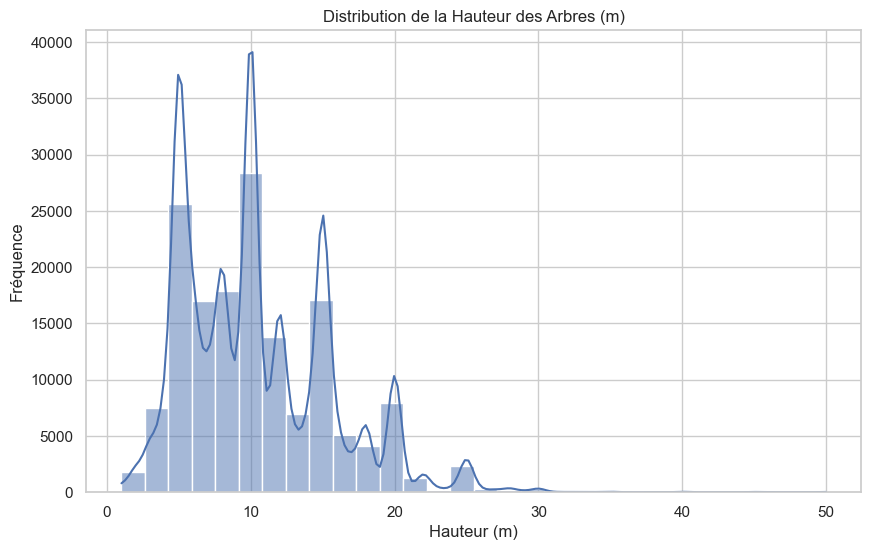

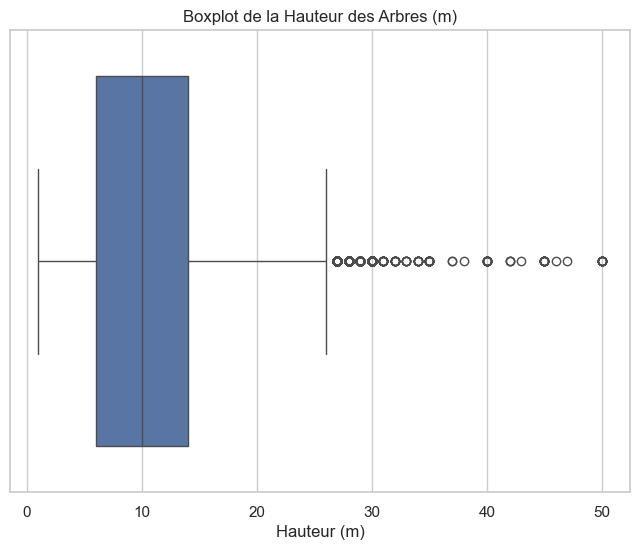

In [41]:
plt.figure(figsize=(10, 6))
sns.histplot(data_clean['hauteur_m'].dropna(), bins=30, kde=True)
plt.title('Distribution de la Hauteur des Arbres (m)')
plt.xlabel('Hauteur (m)')
plt.ylabel('Fréquence')
plt.show()

plt.figure(figsize=(8, 6))
sns.boxplot(x=data_clean['hauteur_m'].dropna())
plt.title('Boxplot de la Hauteur des Arbres (m)')
plt.xlabel('Hauteur (m)')
plt.show()

La **distribution de la hauteur des arbres** présente plusieurs pics distincts, ce qui suggère la présence de groupes d'arbres avec des hauteurs fréquemment observées. Les arbres semblent se concentrer principalement entre 5 et 15 mètres, avec quelques pics notables autour de 5 mètres, 10 mètres et 15 mètres, ce qui pourrait correspondre à des espèces ou stades de développement spécifiques. Il existe également une petite proportion d'arbres avec des hauteurs allant jusqu'à 25 mètres, mais les arbres de plus de 30 mètres deviennent rares, comme le montrent les valeurs plus faibles dans la distribution.

Le **boxplot** montre une large concentration des données entre 5 et 15 mètres, avec une médiane proche de 10 mètres. Les arbres dont la hauteur dépasse 25 mètres sont considérés comme des valeurs atypiques (outliers), comme le montre la présence de points en dehors des moustaches. Cela confirme que, bien que la majorité des arbres aient des hauteurs comprises entre 5 et 15 mètres, il existe une petite minorité atteignant des hauteurs plus élevées.

#### 5.1.2. Distribution de la Circonférence des Arbres

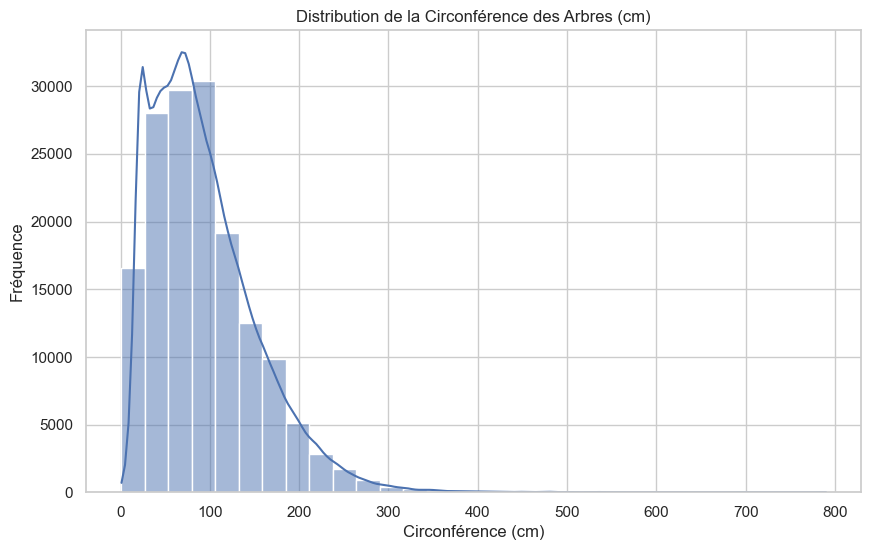

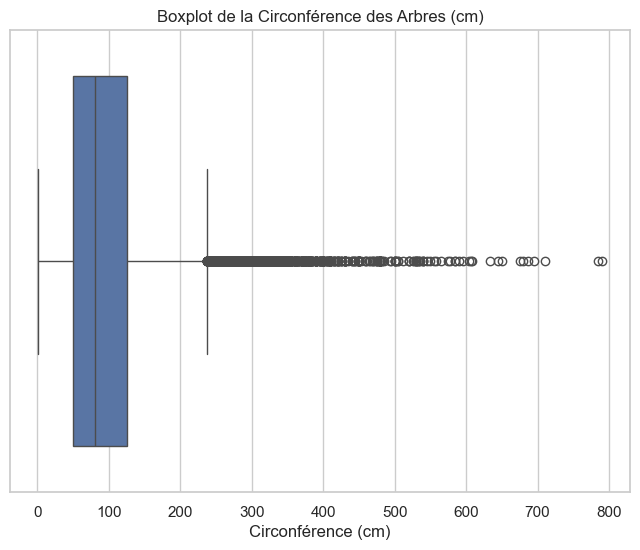

In [42]:
# Visualisation de la distribution de la circonférence des arbres
plt.figure(figsize=(10, 6))
sns.histplot(data_clean['circonference_cm'].dropna(), bins=30, kde=True)
plt.title('Distribution de la Circonférence des Arbres (cm)')
plt.xlabel('Circonférence (cm)')
plt.ylabel('Fréquence')
plt.show()

# Boxplot pour la circonférence des arbres
plt.figure(figsize=(8, 6))
sns.boxplot(x=data_clean['circonference_cm'].dropna())
plt.title('Boxplot de la Circonférence des Arbres (cm)')
plt.xlabel('Circonférence (cm)')
plt.show()

La **distribution de la circonférence des arbres** montre que la majorité des arbres ont une circonférence inférieure à 150 cm, avec un pic marqué entre 50 et 100 cm. Cela suggère que la plupart des arbres dans ce jeu de données ont un tronc de taille modérée, typique des arbres urbains ou d'espèces de taille moyenne. Cependant, la distribution présente une longue queue vers la droite, indiquant la présence de quelques arbres ayant des circonférences beaucoup plus importantes, jusqu'à 800 cm, bien que ces cas soient rares.

Le **boxplot** confirme cette observation : la majorité des arbres se situent dans une fourchette de 50 à 150 cm, mais il existe un nombre important de valeurs atypiques au-delà de 200 cm. Ces arbres, avec des circonférences élevées, sont rares, mais non négligeables dans l'ensemble des données. Les valeurs allant jusqu'à 800 cm sont considérées comme des exceptions, correspondant à des arbres remarquables par leur taille.

#### 5.1.3. Distribution de la Variable Remarquable

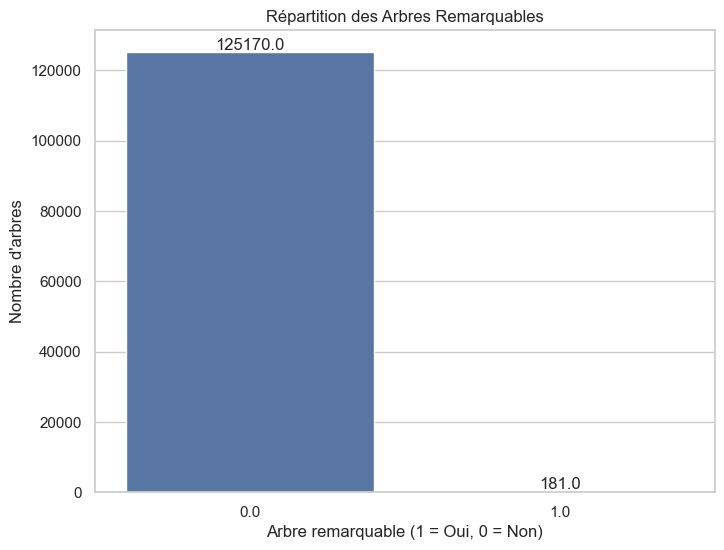

In [43]:
# Visualisation de la répartition des arbres remarquables
plt.figure(figsize=(8, 6))
ax = sns.countplot(x='remarquable', data=data_clean)
plt.title('Répartition des Arbres Remarquables')
plt.xlabel('Arbre remarquable (1 = Oui, 0 = Non)')
plt.ylabel('Nombre d\'arbres')

for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')

plt.show()

Le graphique montre la répartition des arbres **remarquables** par rapport aux arbres **non remarquables**.

- Sur un total de 125 351 arbres, seuls 181 sont classés comme remarquables (avec une valeur de 1), tandis que 125 170 sont non remarquables (valeur de 0).
- Cela confirme que les arbres remarquables représentent une très petite proportion du total, soit environ 0,14 % des arbres.

Cette répartition souligne que les arbres remarquables sont extrêmement rares dans le dataset, ce qui met en avant l'importance de les conserver pour une éventuelle analyse plus approfondie ou une gestion patrimoniale spécifique. Les arbres remarquables méritent une attention particulière en raison de leur statut unique, surtout en tenant compte de leur rareté dans l'ensemble des données analysées.

### 5.2. Analyse des Variables Catégorielles
Nous allons maintenant explorer les variables catégorielles importantes, telles que arrondissement, domanialite, et libelle_francais, pour comprendre la répartition des arbres selon ces catégories.

#### 5.2.1. Répartition des Arbres par Arrondissement

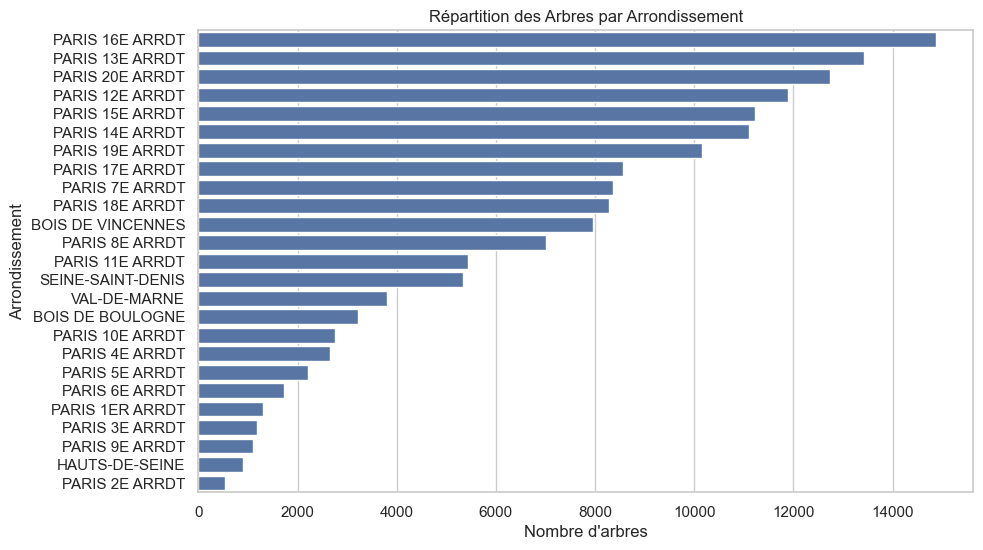

In [44]:
plt.figure(figsize=(10, 6))
sns.countplot(y='arrondissement', data=data_clean, order=data_clean['arrondissement'].value_counts().index)
plt.title('Répartition des Arbres par Arrondissement')
plt.xlabel('Nombre d\'arbres')
plt.ylabel('Arrondissement')
plt.show()

Le graphique montre que le **16e arrondissement** est le plus arboré de Paris, avec plus de **14 000 arbres**, suivi des **13e** et **20e arrondissements**. Les arrondissements périphériques comme les **12e** et **15e** sont également bien dotés en espaces verts, avec plus de **10 000 arbres** chacun. À l'inverse, les arrondissements centraux comme le **2e**, **1er**, et **3e** comptent beaucoup moins d'arbres, en dessous de **3000**. Ces variations reflètent probablement la différence entre la densité urbaine et la taille des espaces verts dans chaque quartier.

#### 5.2.2. Répartition des Domanialités

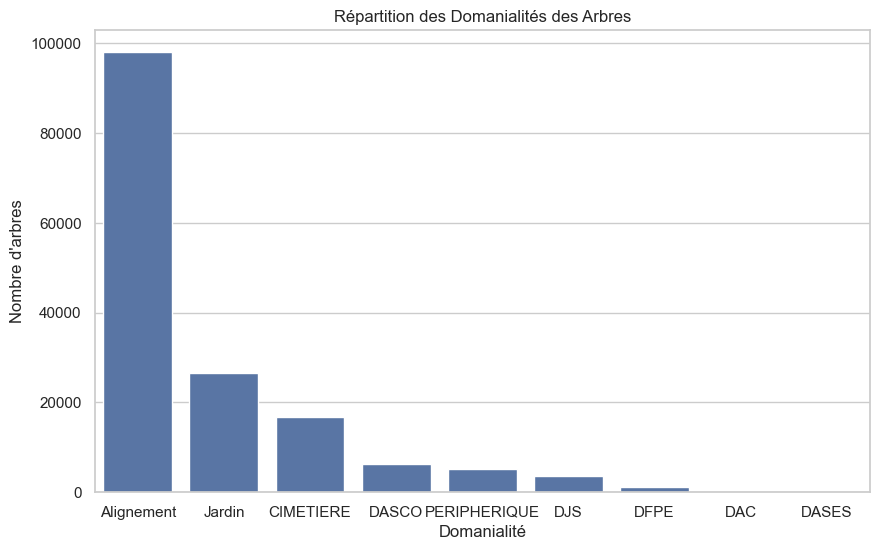

In [45]:
plt.figure(figsize=(10, 6))
sns.countplot(x='domanialite', data=data_clean, order=data_clean['domanialite'].value_counts().index)
plt.title('Répartition des Domanialités des Arbres')
plt.xlabel('Domanialité')
plt.ylabel('Nombre d\'arbres')
plt.show()

Le graphique montre que la majorité des arbres sont classés dans la domanialité **Alignement**, avec près de **100 000 arbres**. Les catégories **Jardin** et **Cimetière** suivent, avec respectivement environ **25 000** et **15 000 arbres**. Les autres domanialités, telles que **DASCO**, **Périphérique**, **DJS**, et **DFPE**, comptent beaucoup moins d'arbres, chacune représentant une petite proportion du total. Cette répartition montre que la plupart des arbres se trouvent en alignement le long des rues, avec une proportion significative également dans les jardins et cimetières. Les autres domanialités représentent des zones plus spécifiques et moins fréquentes dans l'ensemble des données.

#### 5.2.3. Répartition des Espèces d'Arbres (Libelle Français)

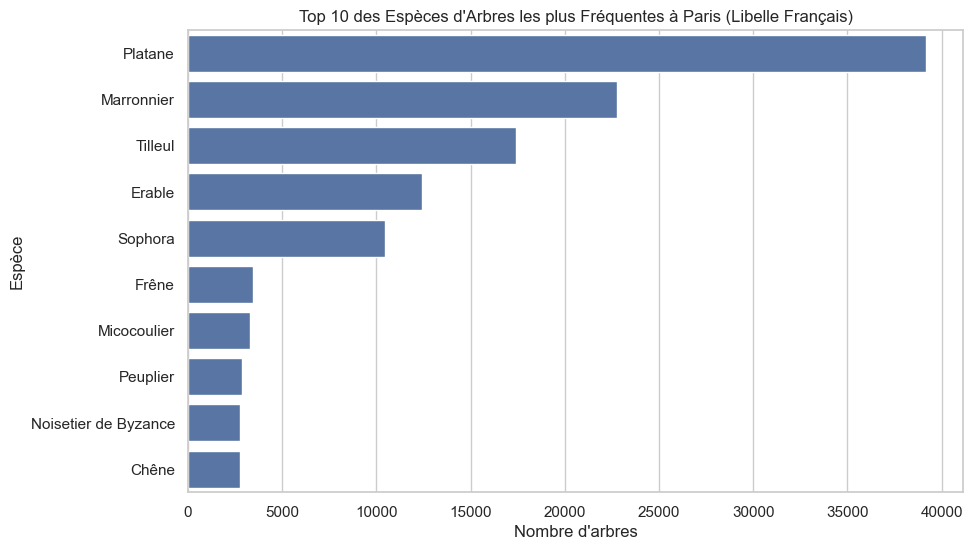

In [46]:
plt.figure(figsize=(10, 6))
top_10_libelle = data_clean['libelle_francais'].value_counts().nlargest(10).index
sns.countplot(y='libelle_francais', data=data_clean[data_clean['libelle_francais'].isin(top_10_libelle)], order=top_10_libelle)
plt.title('Top 10 des Espèces d\'Arbres les plus Fréquentes à Paris (Libelle Français)')
plt.xlabel('Nombre d\'arbres')
plt.ylabel('Espèce')
plt.show()

Le graphique montre les **10 espèces d'arbres les plus fréquentes** à Paris. On observe que les **platanes** dominent largement, avec près de **40 000 arbres**, suivis des **marronniers** et des **tilleuls**, qui comptent chacun environ **25 000** arbres. Les **érables** et **sophoras** viennent ensuite, avec des effectifs entre **10 000** et **15 000** arbres. Les autres espèces, comme le **frêne**, le **micocoulier**, le **peuplier**, le **noisetier de Byzance**, et le **chêne**, sont présentes en plus faibles quantités, avec un nombre d'arbres inférieur à **10 000**.

Cette répartition montre une prédominance d'espèces tolérantes aux environnements urbains, avec le platane largement utilisé pour les plantations en alignement. Cela reflète des choix d'espèces souvent influencés par leur résilience et leur capacité à s'adapter à l'environnement parisien.

### Conclusion

L'analyse univariée révèle que la majorité des arbres parisiens mesurent entre 5 et 15 mètres de hauteur et ont une circonférence inférieure à 150 cm, avec quelques cas remarquables dépassant ces valeurs. Les arbres remarquables, bien que rares (0,15 %), sont cruciaux pour le patrimoine urbain.

Les arrondissements périphériques comme le 16e et le 13e sont les plus arborés, tandis que les arrondissements centraux comptent moins d'arbres. La plupart des arbres sont plantés en alignement, et les platanes, marronniers, et tilleuls sont les espèces les plus fréquentes.

Cette analyse donne un aperçu des caractéristiques clés des arbres parisiens et de leur répartition géographique et botanique.

## 6. Analyse des Variables Géospatiales
### 6.1. Carte des arbres selon leurs coordonnées GPS 

In [47]:
# Paramètres de la carte
map = folium.Map(location=[48.850, 2.390], zoom_start=12)
marker_cluster = MarkerCluster().add_to(map)

MAX_DATA = 10000  # Limite du nombre de marqueurs à afficher

def format_data(row):
    fields = [
        ('Lieu', row['lieu']),
        ('Type', row['libelle_francais']),
        ('Genre', row['genre']),
        ('Espèce', row['espece']),
        ('Circonférence (cm)', row['circonference_cm']),
        ('Hauteur (m)', row['hauteur_m']),
        ('Stade de développement', row['stade_developpement']),
    ]
    
    
    return "<br>".join([f"<b>{label}</b>: {value}" for label, value in fields])


for i, row in data_clean.iloc[:MAX_DATA].iterrows():
    lat, lon = row['geo_point_2d_a'], row['geo_point_2d_b']
    
    if pd.notna(lat) and pd.notna(lon):
        folium.Marker(
            location=[lat, lon],
            popup=format_data(row)
        ).add_to(marker_cluster)

map


La carte montre une forte concentration d'arbres dans l'ouest et le sud de Paris, notamment dans le **16e arrondissement** (jusqu'à **15 935 arbres**) et autour du **Bois de Boulogne** et du **Bois de Vincennes** (**7 611 arbres**). Le **centre de Paris** et des arrondissements comme le **15e** et le **14e** comptent également beaucoup d'arbres (**10 445**).

En revanche, les zones nord-est de Paris, comme **Pantin** et **Saint-Denis**, ont une plus faible densité arborée (environ **400 à 600 arbres**). Les périphéries sud et sud-ouest montrent une couverture modérée, avec environ **1 800 à 2 500 arbres**.

En résumé, les zones les plus arborées se situent autour des grands espaces verts, tandis que les zones plus urbanisées, en particulier au nord-est, sont moins arborées.

### 6.2 Répartition géographique des arbres remarquables

In [48]:
arbres_remarquables = data_clean[data_clean['remarquable'] == 1]

carte_remarquables = folium.Map(location=[48.8566, 2.3522], zoom_start=12)

for _, row in arbres_remarquables.iterrows():
    folium.Marker(
        location=[row['geo_point_2d_a'], row['geo_point_2d_b']],
        popup=row['libelle_francais'],  # Optionnel : afficher le nom de l'espèce
        icon=folium.Icon(color="green")
    ).add_to(carte_remarquables)


carte_remarquables

La carte montre la **répartition géographique des arbres remarquables** à Paris. Voici les points clés à retenir :

1. **Forte concentration dans l'ouest de Paris** : Les arbres remarquables sont nombreux dans des zones comme le **Bois de Boulogne** et les arrondissements voisins (**16e et 15e arrondissements**), connus pour leurs grands espaces verts.
   
2. **Concentration autour du centre-nord** : Des regroupements significatifs d'arbres remarquables apparaissent également dans le **18e** et le **19e arrondissements**, ainsi qu'autour de **Montmartre** et **Pigalle**.

3. **Présence dans l'est et sud-est** : Le **Bois de Vincennes** se distingue avec plusieurs arbres remarquables, de même que certaines zones du **12e arrondissement** et de **Saint-Mandé**.

4. **Moins d'arbres remarquables dans les arrondissements centraux** : Le cœur de Paris (1er, 2e, 3e arrondissements) présente peu d'arbres remarquables, ce qui s'explique par la forte urbanisation de ces zones.

### Conclusion
Les arbres remarquables sont principalement situés dans les grands espaces verts à la périphérie ou dans les parcs urbains, tandis que les zones centrales très urbanisées sont moins arborées. Cela reflète l'aménagement urbain de Paris, où la préservation des arbres remarquables est concentrée dans des zones spécifiquement dédiées aux espaces verts.

## 7. Synthèse des Résultats

La **synthèse des résultats** a pour but de résumer les principales observations effectuées tout au long de l'analyse, en identifiant les points importants en lien avec la gestion des arbres de Paris et les défis pour l'optimisation de leur entretien dans le cadre d'une Smart City. Voici un plan d'action pour cette partie :

#### 1. **Résumé des Observations Principales**
   - **Répartition des espèces et caractéristiques physiques des arbres** : 
     - Les **platanes**, **marronniers**, et **tilleuls** sont les espèces d'arbres les plus représentées.
     - La majorité des arbres ont une hauteur comprise entre **5 et 15 mètres** et une circonférence inférieure à **150 cm**.
   
   - **Répartition géographique** :
     - Les arrondissements les plus arborés sont situés à la périphérie ou dans les zones avec des grands espaces verts, comme le **16e** arrondissement et les bois de **Boulogne** et **Vincennes**.
     - Les arrondissements centraux et les zones urbaines denses comptent beaucoup moins d'arbres.

   - **Arbres remarquables** :
     - Les arbres remarquables sont rares (moins de 0,15 % des arbres) mais concentrés dans des zones spécifiques comme le **Bois de Boulogne**, le **Bois de Vincennes**, et quelques quartiers bien arborés.

#### 2. **Gestion des Anomalies et Qualité des Données**
   - Les valeurs aberrantes en termes de **hauteur** et **circonférence** ont été nettoyées pour garantir la fiabilité de l'analyse.
   - Les doublons et valeurs manquantes ont été traités pour améliorer la qualité des données et éviter les biais dans l'interprétation des résultats.

#### 3. **Implications pour la Gestion Urbaine**
   - Les zones avec une densité plus faible d'arbres, comme les arrondissements centraux, pourraient bénéficier d'une augmentation du nombre d'arbres pour améliorer la qualité de l'air et la biodiversité.
   - Les **arbres remarquables**, en tant qu'éléments rares et précieux, doivent être surveillés de manière particulière pour assurer leur conservation dans un environnement urbain en constante évolution.
   
#### 4. **Prochaines Étapes**
   - Une analyse plus approfondie pourrait être réalisée pour évaluer l'impact des arbres sur des aspects comme la **biodiversité** urbaine, la **qualité de l'air**, ou encore les **températures locales** (effet îlot de chaleur).
   - Des recommandations pourraient être formulées pour optimiser la plantation d'arbres dans les zones urbaines denses ou renforcer la protection des arbres remarquables.


## 8. Conclusion et Recommandations pour la Gestion des Arbres Urbains

À la lumière des analyses effectuées sur la répartition des arbres à Paris, plusieurs recommandations peuvent être formulées pour une gestion plus durable et efficace des espaces verts dans le contexte d'une **Smart City** :

#### 1. **Améliorer la couverture arborée dans les zones moins arborées**
   - Les arrondissements centraux, ainsi que certaines zones à forte urbanisation (comme le **2e**, le **3e**, et le **9e arrondissements**), sont significativement moins arborés que les arrondissements périphériques. Une **priorisation de la plantation d'arbres** dans ces zones pourrait contribuer à une meilleure qualité de l'air, à la réduction des îlots de chaleur, et à l'amélioration de la biodiversité.
   
#### 2. **Renforcer la gestion des arbres remarquables**
   - Les arbres remarquables, bien que rares (environ 0,15 % du total), sont des éléments précieux du patrimoine naturel de la ville. Il est recommandé d’instaurer un suivi régulier de ces arbres, avec une base de données actualisée qui inclut des informations sur leur état de santé, leur localisation précise, et les actions de conservation nécessaires. Des **initiatives de sensibilisation** pourraient également être mises en place pour informer les citoyens de l’importance de ces arbres.

#### 3. **Établir des stratégies de gestion des espèces diversifiées**
   - L'analyse a montré une **prédominance de certaines espèces**, comme les platanes, marronniers, et tilleuls. Bien que ces espèces soient adaptées à l’environnement urbain, il est crucial d'encourager une **diversification des espèces** plantées pour réduire la vulnérabilité face aux maladies et aux parasites, ainsi que pour accroître la résilience face au changement climatique.

#### 4. **Optimisation de l’espace pour les arbres en alignement**
   - Les arbres en alignement représentent la majorité des arbres à Paris. Il est donc essentiel de continuer à optimiser leur gestion, notamment en veillant à ce que l'espace autour des arbres soit suffisant pour permettre leur croissance tout en préservant la sécurité des piétons et des infrastructures urbaines. Des solutions innovantes comme l’utilisation de **pavés perméables** ou la gestion des racines avec des systèmes de drainage adaptés pourraient être envisagées.

---

### Conclusion
Cette analyse a permis de comprendre la répartition actuelle des arbres à Paris, ainsi que d’identifier des points d’amélioration pour leur gestion future. En intégrant des stratégies de gestion durable et en utilisant les données pour mieux planifier les interventions, Paris pourrait non seulement préserver ses espaces verts, mais aussi les développer pour mieux répondre aux défis climatiques et urbains à venir.